# **Breaking Bottlenecks: Delivery Gameplan for Olist**
Courtesy of Team Alpha (DTIDSOL-02):
- Josephine Rahma Gunawan
- Rio Pramana
- Risma Widiya Puspadevi

### **Contents:**

1. Understanding the Business Problem
2. Data Cleaning & Familiarisation
3. Exploratory Data Analysis (EDA)
4. Insights & Key Findings
5. Summary of Findings
6. Conclusion & Business Implications
7. Limitations & Considerations
8. Actionable Recommendations

# **1. Understanding the Business Problems**

### Background and Business Objective

E-commerce has rapidly transformed how people shop, especially in Brazil, where convenience, price, and speed play crucial roles in consumer decisions. According to a report by **NielsenIQ**, Brazilian shoppers cited the following top reasons for choosing online platforms:

- **77%** – Best price  
- **57%** – Delivery time  
- **54%** – Product variety  
- **39%** – Special promotions (e.g., free shipping, discounts, loyalty programmes)

The fact that *delivery time* ranks second highlights just how important a fast, reliable shipping experience is to customers (nearly as important as pricing itself).

For **Olist**, a major e-commerce platform that connects small and medium-sized retailers to marketplaces in Brazil, this puts increasing pressure on fulfilment operations. Delivery performance isn’t just a logistical concern. It's a business-critical metric that can influence customer satisfaction, retention, and ultimately, sales performance.

### Why Focus on On-Time Delivery (OTD)?

To evaluate delivery performance, we focus on the industry-standard metric: **On-Time Delivery (OTD)**. OTD measures the percentage of orders delivered within the promised timeframe and is calculated as:

> **OTD (%) = (Number of on-time deliveries / Total deliveries in the period) × 100**

As highlighted in a blog by **[Delage](https://delage.com.br/blog/otd-on-time-delivery-saiba-tudo-sobre-um-dos-principais-indicadores-para-o-e-commerce/)**, OTD has become one of the most relevant indicators in e-commerce logistics today. It reflects the efficiency of the entire order fulfilment process from the time an order is picked and packed to when it’s handed off by the courier.

Importantly, a survey by **Reclame Aqui** showed that **18.6% of consumers abandon their online shopping carts** if the estimated delivery time doesn’t meet their expectations. While this figure may seem modest at first glance, nearly **1 in 5 lost sales** can severely impact an e-commerce company’s bottom line, especially at scale.

Furthermore, an article by **[Gazeta do Povo](https://www.gazetadopovo.com.br/economia/e-commerce-brasileiro-busca-alternativas-a-correiodependencia-an1xq7tj25k1nnxytsml2tb4q/)** noted that logistics companies proudly advertise achieving **95% OTD** as a sign of operational excellence. While not a formal industry standard, this 95% mark is widely regarded as a benchmark for competitive performance in Brazil’s e-commerce landscape.

### Project Objective

Given the critical role that delivery time plays in consumer satisfaction and conversion rates, the objective of this project is to:

> **Improve Olist's delivery performance by increasing its On-Time Delivery (OTD) rate, aiming for a minimum benchmark of 95%.**

In addition to descriptive and diagnostic analysis, this project also leverages **machine learning to predict whether a delivery will be late or on time** based on various features available at the time of order. The goal is to take **preventive action** on high-risk deliveries such as prioritising processing or flagging for courier follow-up before issues occur.

Through data-driven insights and predictive modelling, this project aims to help Olist optimise its logistics performance, meet customer expectations, and improve overall business outcomes.

# **2. Data Cleaning & Familiarisation**

## Import Libraries & Datasets

In [1]:
# Data Handling & Manipulation
import pandas as pd                                         # for dataframes, CSV/Excel reading, tabular data manipulation
import numpy as np                                          # for numerical operations and array handling

# Data Visualisation (Static)
import matplotlib.pyplot as plt                             # for creating static plots
from matplotlib.ticker import FuncFormatter                 # for customising tick labels (e.g., currency, %)
import seaborn as sns                                       # for statistical visualisation (heatmaps, distplots, etc.)

# Data Visualisation (Interactive)
import plotly.express as px                                 # for quick and interactive visualisation
import plotly.graph_objects as go                           # for custom interactive plots
from plotly.subplots import make_subplots                   # for interactive subplots

# Statistical Testing & Inference
from statsmodels.stats.proportion import proportions_ztest  # for comparing proportions (e.g., late vs. on-time)
from scipy.stats import (
    normaltest,                                             # for checking normality
    chi2_contingency,                                       # for categorical association
    mannwhitneyu,                                           # for non-parametric testing
    ttest_ind,                                              # for independent sample t-test
    f_oneway,                                               # for one-way ANOVA
    kruskal,                                                # for Kruskal-Wallis test
    kstest,                                                 # for Kolmogorov-Smirnov test
    spearmanr                                               # for spearmean correlation
)
import statsmodels.api as sm                                # for advanced statistical modelling and diagnostics
import statsmodels.formula.api as smf                       # for formula-based statistical models
from statsmodels.stats.multicomp import pairwise_tukeyhsd   # for post-hoc tests after ANOVA

# Data Quality & Missing Value Visualisation
import missingno as msno                                    # for visualising missing data patterns

# System & Settings
import os                                                   # for file handling and directory operations
import warnings                                             # to suppress or manage warning messages
warnings.filterwarnings("ignore", category=FutureWarning)
pd.set_option('display.max_colwidth', None)                 # display full content in cells (useful for text data)

In [2]:
# List of date columns for each Olist dataset
# This dictionary maps each dataset filename to a list of columns that should be parsed as dates.
date_cols = {
    'olist_orders_dataset.csv': [
        'order_purchase_timestamp',
        'order_approved_at',
        'order_delivered_carrier_date',
        'order_delivered_customer_date',
        'order_estimated_delivery_date',
    ],
    'olist_order_items_dataset.csv': [
        'shipping_limit_date',
    ],
    'olist_order_reviews_dataset.csv': [
        'review_creation_date',
        'review_answer_timestamp',
    ],
    # The following datasets have NO date columns:
    # 'olist_customers_dataset.csv'
    # 'olist_geolocation_dataset.csv'
    # 'olist_order_payments_dataset.csv'
    # 'olist_products_dataset.csv'
    # 'olist_sellers_dataset.csv'
    # 'product_category_name_translation.csv'
    'master_olist_dataset.csv': [
        'order_purchase_timestamp',
        'order_approved_at',
        'order_delivered_carrier_date',
        'order_delivered_customer_date',
        'order_estimated_delivery_date',
        'shipping_limit_date',
        'review_creation_date',
        'review_answer_timestamp',
    ]
}

def read_olist_csv(path):
    """
    Reads an Olist CSV and parses dates for the correct columns.
    Args:
        path (str): Path to the CSV file.
    Returns:
        pd.DataFrame: Loaded dataframe with date columns parsed as datetime.
    """
    # Extract just the filename, e.g., 'olist_orders_dataset.csv'
    filename = os.path.basename(path)
    # Get the correct date columns for this file, or an empty list
    parse_dates = date_cols.get(filename, [])
    # Read the CSV, parsing the specified date columns (if any)
    return pd.read_csv(path, parse_dates=parse_dates)

Load original (raw) datasets:

In [3]:
original_df_orders           = read_olist_csv('../data/original_data/olist_orders_dataset.csv')
original_df_customers        = read_olist_csv('../data/original_data/olist_customers_dataset.csv')
original_df_order_items      = read_olist_csv('../data/original_data/olist_order_items_dataset.csv')
original_df_order_payments   = read_olist_csv('../data/original_data/olist_order_payments_dataset.csv')
original_df_reviews          = read_olist_csv('../data/original_data/olist_order_reviews_dataset.csv')
original_df_products         = read_olist_csv('../data/original_data/olist_products_dataset.csv')
original_df_prod_cat_tr      = read_olist_csv('../data/original_data/product_category_name_translation.csv')
original_df_sellers          = read_olist_csv('../data/original_data/olist_sellers_dataset.csv')
original_df_geolocation      = read_olist_csv('../data/original_data/olist_geolocation_dataset.csv')

Load cleaned datasets

In [4]:
cleaned_delivered_df_orders           = read_olist_csv('../data/cleaned_data/olist_orders_dataset.csv')
cleaned_df_customers        = read_olist_csv('../data/cleaned_data/olist_customers_dataset.csv')
cleaned_delivered_df_order_items      = read_olist_csv('../data/cleaned_data/olist_order_items_dataset.csv')
cleaned_delivered_df_order_payments   = read_olist_csv('../data/cleaned_data/olist_order_payments_dataset.csv')
cleaned_delivered_df_reviews          = read_olist_csv('../data/cleaned_data/olist_order_reviews_dataset.csv')
cleaned_df_products         = read_olist_csv('../data/cleaned_data/olist_products_dataset.csv')
cleaned_df_prod_cat_tr      = read_olist_csv('../data/cleaned_data/product_category_name_translation.csv')
cleaned_df_sellers          = read_olist_csv('../data/cleaned_data/olist_sellers_dataset.csv')
cleaned_df_geolocation      = read_olist_csv('../data/cleaned_data/olist_geolocation_dataset.csv')

Load master dataset

In [5]:
master_olist_dataset = read_olist_csv('../data/cleaned_data/master_olist_dataset.csv')

# **3. EDA**

In [6]:
master_olist_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109933 entries, 0 to 109932
Data columns (total 41 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       109933 non-null  object        
 1   customer_id                    109933 non-null  object        
 2   order_status                   109933 non-null  object        
 3   order_purchase_timestamp       109933 non-null  datetime64[ns]
 4   order_approved_at              109933 non-null  datetime64[ns]
 5   order_delivered_carrier_date   109933 non-null  datetime64[ns]
 6   order_delivered_customer_date  109933 non-null  datetime64[ns]
 7   order_estimated_delivery_date  109933 non-null  datetime64[ns]
 8   customer_unique_id             109933 non-null  object        
 9   customer_zip_code_prefix       109933 non-null  int64         
 10  customer_city                  109933 non-null  object        
 11  

In [7]:
master_olist_dataset.duplicated().sum()

0

In [8]:
master_olist_dataset.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,payment_types,max_installments,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,has_review,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,"credit_card, voucher",1.0,a54f0611adc9ed256b57ede6b6eb5114,4.0,NaN,"Não testei o produto ainda, mas ele veio correto e em boas condições. Apenas a caixa que veio bem amassada e danificada, o que ficará chato, pois se trata de um presente.",2017-10-11,2017-10-12 03:43:48,True,housewares
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,...,boleto,1.0,8d5266042046a06655c8db133d120ba5,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08,2018-08-08 18:37:50,True,perfumery
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,...,credit_card,3.0,e73b67b67587f7644d5bd1a52deb1b01,5.0,NaN,NaN,2018-08-18,2018-08-22 19:07:58,True,auto
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,...,credit_card,1.0,359d03e676b3c069f62cadba8dd3f6e8,5.0,NaN,O produto foi exatamente o que eu esperava e estava descrito no site e chegou bem antes da data prevista.,2017-12-03,2017-12-05 19:21:58,True,pet_shop
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,9195,...,credit_card,1.0,e50934924e227544ba8246aeb3770dd4,5.0,NaN,NaN,2018-02-17,2018-02-18 13:02:51,True,stationery


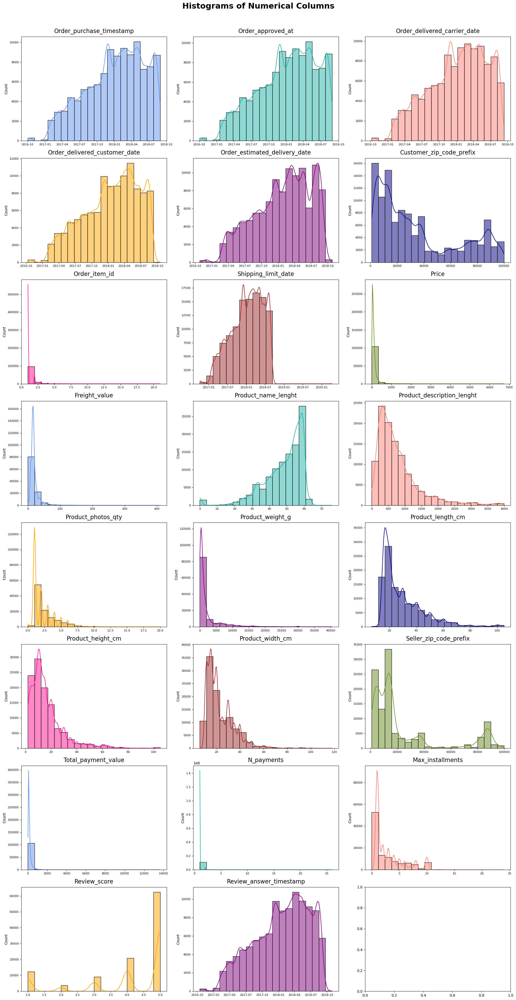

In [9]:
#data distribution 
# Filter only numerical columns (float and int)
onlynumeric_columns = master_olist_dataset.select_dtypes(include=['float64','int64','datetime64']).columns.to_list()

# Calculate the number of rows and columns needed for the plots
n_plots = len(onlynumeric_columns)
n_rows = int(np.ceil(n_plots / 3)) #4colums

# Create the subplots
fig, axes = plt.subplots(n_rows, 3, figsize=(20, 5 * n_rows))
axes = axes.flatten()

# Colors of the histogram
colors = ['cornflowerblue', 'lightseagreen', 'salmon', 'orange', 'purple', 'navy', 'deeppink', 'brown','olivedrab']

# Plot histograms for each numeric column with different colors
for i, column in enumerate(onlynumeric_columns):
    color_index = i % len(colors)  
    sns.histplot(data=master_olist_dataset, x=column, kde=True, bins=20, ax=axes[i], color=colors[color_index])
    axes[i].set_title(column.capitalize(), fontsize=16, pad=10)  
    axes[i].set_xlabel('')  
    axes[i].set_ylabel('Count') 
    axes[i].tick_params(axis='both', labelsize=8)  

plt.suptitle('Histograms of Numerical Columns', fontsize=22, fontweight='bold')

plt.tight_layout(rect=[0, 0.02, 1, 0.97])
plt.show()

## **3.1 Overview**

### **3.1.1 Sales**

In [10]:
df_sales = master_olist_dataset[['order_id','seller_id', 'customer_id', 'order_status', 'order_purchase_timestamp','price']].copy()

In [11]:
df_sales.head()

,order_id,seller_id,customer_id,order_status,order_purchase_timestamp,price
0,e481f51cbdc54678b7cc49136f2d6af7,3504c0cb71d7fa48d967e0e4c94d59d9,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,29.99
1,53cdb2fc8bc7dce0b6741e2150273451,289cdb325fb7e7f891c38608bf9e0962,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,118.70
2,47770eb9100c2d0c44946d9cf07ec65d,4869f7a5dfa277a7dca6462dcf3b52b2,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,159.90
3,949d5b44dbf5de918fe9c16f97b45f8a,66922902710d126a0e7d26b0e3805106,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,45.00
4,ad21c59c0840e6cb83a9ceb5573f8159,2c9e548be18521d1c43cde1c582c6de8,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,19.90


In [12]:
df_sales.nunique()


order_id                    96266
seller_id                    2965
customer_id                 96266
order_status                    1
order_purchase_timestamp    95745
price                        5857
dtype: int64

In [13]:
# sales per month with number of orders and buyers

df_sales['Year-Month (Purchase)'] = df_sales['order_purchase_timestamp'].dt.to_period('M')
df_sales['Year-Month (Purchase)'] = df_sales['Year-Month (Purchase)'].dt.to_timestamp()

monthly_sales = df_sales.groupby('Year-Month (Purchase)').agg(
    monthly_revenue = ('price','sum'),
    total_orders = ('order_id', 'count'),
    total_buyers = ('customer_id', 'nunique'),
    total_sellers = ('seller_id', 'nunique')
).reset_index()

print("Monthly sales data:")
monthly_sales

Monthly sales data:


,Year-Month (Purchase),monthly_revenue,total_orders,total_buyers,total_sellers
0,2016-10-01,39738.17,308,261,128
1,2016-12-01,10.90,1,1,1
2,2017-01-01,111609.71,911,749,218
3,2017-02-01,233832.81,1854,1651,401
4,2017-03-01,359022.85,2892,2542,475
5,2017-04-01,340466.68,2562,2297,488
6,2017-05-01,488869.27,4001,3544,562
7,2017-06-01,421664.48,3484,3132,518
8,2017-07-01,479926.62,4385,3859,590
9,2017-08-01,554149.91,4791,4189,683


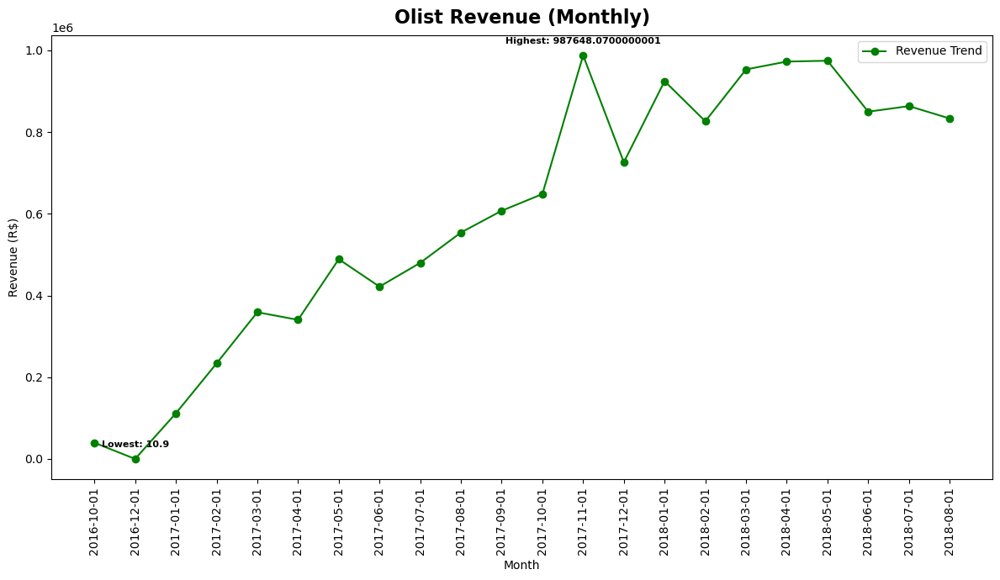

In [14]:
plt.figure(figsize=(12, 7))
monthlyprofit_values = monthly_sales['monthly_revenue'].replace('R$', '').astype(float)
plt.plot(monthly_sales['Year-Month (Purchase)'].astype(str), monthlyprofit_values, marker='o', linestyle='-', color='green',label='Revenue Trend')

# Finding the index of the highest and lowest values
max_index_p = monthlyprofit_values.idxmax()
min_index_p = monthlyprofit_values.idxmin()

# highest and lowest values
plt.annotate(f"Highest: {monthly_sales['monthly_revenue'][max_index_p]}", 
             (monthly_sales['Year-Month (Purchase)'].astype(str)[max_index_p], monthlyprofit_values[max_index_p]),
             textcoords="offset points", xytext=(0,10), ha='center', fontsize=8, fontweight='bold')
plt.annotate(f"Lowest: {monthly_sales['monthly_revenue'][min_index_p]}", 
             (monthly_sales['Year-Month (Purchase)'].astype(str)[min_index_p], monthlyprofit_values[min_index_p]),
             textcoords="offset points", xytext=(0,10), ha='center', fontsize=8, fontweight='bold')

plt.xlabel('Month')
plt.ylabel('Revenue (R$)')
plt.title('Olist Revenue (Monthly)', size=16, pad=10, fontweight='bold')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()

plt.show()

Olist revenue has increased steadily since January 2017 and achieved its highest revenue in November 2017 (R$ 1027045.57). In 2018, the reveneu trend has been fluctuated, but steady at abouve R$ 800k. 

In [15]:
# total orders, buyers, sellers per month by transaction

print('Multilines Chart of Monthly Sales:')

#Plotly figure with multilines chart
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=monthly_sales['Year-Month (Purchase)'],
    y=monthly_sales['total_orders'],
    mode='lines+markers',
    name='Total Orders'
))

fig.add_trace(go.Scatter(
    x=monthly_sales['Year-Month (Purchase)'],
    y=monthly_sales['total_buyers'],
    mode='lines+markers',
    name='Total Buyers'
))

fig.add_trace(go.Scatter(
    x=monthly_sales['Year-Month (Purchase)'],
    y=monthly_sales['total_sellers'],
    mode='lines+markers',
    name='Total Sellers'
))

fig.update_layout(
    title='Total Orders, Buyers, and Sellers (Monthly)', title_x=0.5,
    xaxis_title='Month',
    yaxis_title='Count',
    legend_title='Metric',
    template='plotly_white'
)

Multilines Chart of Monthly Sales:


The chart above displays the number of orders, buyers and seller each based (transaction-based). In line with Olist-revenue, the total orders and buyers have increased steadily since January 2017 and reached their peak in November 2017. The number of sellers whose products are sold also increase. 

### **3.1.2 Sellers**

In [16]:
# Number of unique seller cities:
state_counts = master_olist_dataset['seller_state'].value_counts().reset_index()
state_counts.columns = ['seller_state', 'count']

fig = px.bar(state_counts, x='seller_state', y='count', 
             title='Number of Sellers by State', 
             labels={'count': 'Number of Sellers'})
fig.show()

In [17]:
# Top 10 cities by number of sellers, coloured by state:
city_state = master_olist_dataset.groupby(['seller_city', 'seller_state'])['seller_id'].nunique().reset_index()
city_state.columns = ['seller_city', 'seller_state', 'seller_count']

top_city_state = city_state.sort_values('seller_count', ascending=False).head(10)

fig = px.bar(top_city_state, x='seller_count', y='seller_city', color='seller_state',
             title='Top 10 Cities by Number of Sellers (Coloured by State)',
             labels={'seller_count': 'Number of Sellers', 'seller_city': 'City'})
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

In [18]:
# Total number of items per seller
seller_kpi = master_olist_dataset.groupby('seller_id').agg(
    total_items=('order_id', 'count'),
    unique_orders=('order_id', 'nunique')
).reset_index()

seller_kpi.head()

,seller_id,total_items,unique_orders
0,0015a82c2db000af6aaaf3ae2ecb0532,3,3
1,001cca7ae9ae17fb1caed9dfb1094831,234,195
2,002100f778ceb8431b7a1020ff7ab48f,54,50
3,003554e2dce176b5555353e4f3555ac8,1,1
4,004c9cd9d87a3c30c522c48c4fc07416,168,156


In [19]:
# Count how many unique sellers each order has
items_per_order = master_olist_dataset.groupby('order_id')['seller_id'].nunique().reset_index(name='unique_seller_count')
items_per_order.head()

,order_id,unique_seller_count
0,00010242fe8c5a6d1ba2dd792cb16214,1
1,00018f77f2f0320c557190d7a144bdd3,1
2,000229ec398224ef6ca0657da4fc703e,1
3,00024acbcdf0a6daa1e931b038114c75,1
4,00042b26cf59d7ce69dfabb4e55b4fd9,1


In [20]:
multiple_sellers_orders = items_per_order[items_per_order['unique_seller_count'] > 1]
multiple_sellers_orders = multiple_sellers_orders.sort_values(by='unique_seller_count', ascending=False)
multiple_sellers_orders

,order_id,unique_seller_count
10578,1c11d0f4353b31ac3417fbfa5f0f2a8a,5
10962,1d23106803c48c391366ff224513fb7f,4
52498,8c2b13adf3f377c8f2b06b04321b0925,4
96165,ffb8f7de8940249a3221252818937ecb,3
63533,a98012aa8c697f2bcff9f8c2183e0f2b,3
...,...,...
33438,591083bc42b589c7052118aa83118e76,2
33382,58e03095584d960583933517a2aae5df,2
33345,58c4df4904044782bb1361c5cb001538,2
32836,57638520434d4c12b81d532ad9bf2f1f,2


In [21]:

print(multiple_sellers_orders.shape)

(1252, 2)


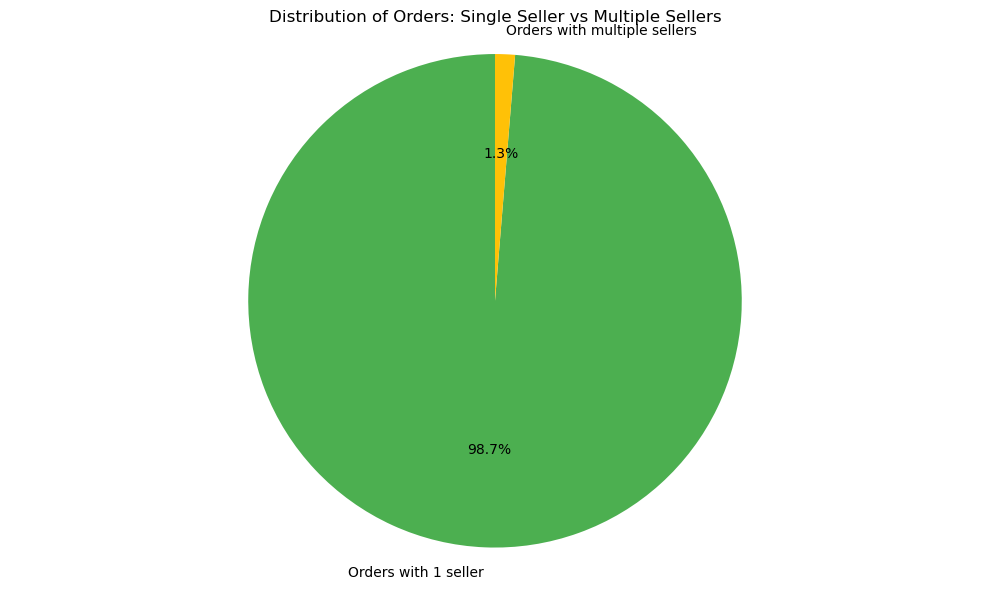

Orders with 1 seller: 95014 (98.70%)
Orders with multiple sellers: 1252 (1.30%)


In [22]:
# Count the number of orders with 1 seller and orders with multiple sellers
single_seller_orders_count = len(items_per_order[items_per_order['unique_seller_count'] == 1])
multiple_seller_orders_count = len(items_per_order[items_per_order['unique_seller_count'] > 1])

# Create labels and values for the pie chart
labels = ['Orders with 1 seller', 'Orders with multiple sellers']
sizes = [single_seller_orders_count, multiple_seller_orders_count]

# Create the pie chart
plt.figure(figsize=(10, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=['#4CAF50', '#FFC107'])
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.title('Distribution of Orders: Single Seller vs Multiple Sellers')
plt.tight_layout()
plt.show()

# Print the actual numbers
print(f"Orders with 1 seller: {single_seller_orders_count} ({single_seller_orders_count/len(items_per_order)*100:.2f}%)")
print(f"Orders with multiple sellers: {multiple_seller_orders_count} ({multiple_seller_orders_count/len(items_per_order)*100:.2f}%)")

### **3.1.3 Customers**

In [23]:
df_customers_geo = master_olist_dataset[['customer_id','customer_unique_id','customer_zip_code_prefix','customer_state','customer_city']].reset_index()


In [24]:
df_customers_state = master_olist_dataset[['customer_unique_id', 'customer_state']].drop_duplicates().reset_index(drop=True)


In [25]:
top_state = df_customers_state['customer_state'].value_counts().nlargest(10).reset_index()
top_state

,customer_state,count
0,SP,39080
1,RJ,11898
2,MG,10974
3,RS,5149
4,PR,4756
5,SC,3437
6,BA,3154
7,DF,2015
8,ES,1922
9,GO,1889


In [26]:
# Customer state distribution:
fig = px.histogram(
    df_customers_state,
    x='customer_state',
    title='Number of Customers by State',
    labels={'customer_state': 'State'},
    color='customer_state',                     
    color_discrete_sequence=px.colors.qualitative.Plotly,
      
)

fig.update_layout(
    xaxis_title='State',
    yaxis_title='Number of Customers',
    template='plotly_white'
)   
fig.show()


In [27]:
top_cities = df_customers_geo['customer_city'].value_counts().nlargest(20).reset_index()
top_cities

,customer_city,count
0,sao paulo,17368
1,rio de janeiro,7577
2,belo horizonte,3074
3,brasilia,2337
4,curitiba,1724
5,campinas,1626
6,porto alegre,1563
7,salvador,1355
8,guarulhos,1290
9,sao bernardo do campo,1038


In [28]:
# Customer city distribution (top 20):
top_cities = df_customers_geo['customer_city'].value_counts().nlargest(20).reset_index()
top_cities.columns = ['city', 'count']

fig = px.bar(
    top_cities,
    x='city',
    y='count',
    title='Top 20 Customers Cities',
    color='count',
    color_continuous_scale='Oxy'
)

fig.update_layout(
    xaxis_title='Cities',
    yaxis_title='Count',
    template='plotly_white'
)  
fig.show()

##### **Customer behaviours**

In [29]:
#popular products by sales count
popular_products = master_olist_dataset.groupby(['product_id','product_category_name','product_category_name_english']).agg(sales_count=('order_id', 'count'), revenue = ('price','sum')).reset_index()
top10_products_bysales = popular_products.sort_values(by='sales_count', ascending=False).head(10)      
display(top10_products_bysales)

,product_id,product_category_name,product_category_name_english,sales_count,revenue
21571,aca2eb7d00ea1a7b8ebd4e68314663af,moveis_decoracao,furniture_decor,520,37104.30
8409,422879e10f46682990de24d770e7f83d,ferramentas_jardim,garden_tools,484,26577.22
19249,99a4788cb24856965c36a24e339b6058,cama_mesa_banho,bed_bath_table,477,42049.66
7188,389d119b48cf3043d311335e499d9c6b,ferramentas_jardim,garden_tools,390,21336.79
6908,368c6c730842d78016ad823897a372db,ferramentas_jardim,garden_tools,388,21056.80
10565,53759a2ecddad2bb87a079a1f1519f73,ferramentas_jardim,garden_tools,373,20387.20
26377,d1c427060a0f73f6b889a5c7c61f2ac4,informatica_acessorios,computers_accessories,331,45510.57
10592,53b36df67ebb7c41585e8d54d6772e08,relogios_presentes,watches_gifts,321,37454.63
2725,154e7e31ebfa092203795c972e5804a6,beleza_saude,health_beauty,274,6173.26
7862,3dd2a17168ec895c781a9191c1e95ad7,informatica_acessorios,computers_accessories,272,40782.80


In [30]:
#popular products by revenue
popular_products = master_olist_dataset.groupby(['product_id','product_category_name','product_category_name_english']).agg(sales_count=('order_id', 'count'), revenue = ('price','sum')).reset_index()
top10_products_byrevenue = popular_products.sort_values(by='revenue', ascending=False).head(10)      
display(top10_products_byrevenue)

,product_id,product_category_name,product_category_name_english,sales_count,revenue
23496,bb50f2e236e5eea0100680137654686c,beleza_saude,health_beauty,194,63560.00
13718,6cdd53843498f92890544667809f1595,beleza_saude,health_beauty,153,53652.30
26938,d6160fb7873f184099d9bc95e30376af,pcs,computers,33,45949.35
26377,d1c427060a0f73f6b889a5c7c61f2ac4,informatica_acessorios,computers_accessories,331,45510.57
19249,99a4788cb24856965c36a24e339b6058,cama_mesa_banho,bed_bath_table,477,42049.66
7862,3dd2a17168ec895c781a9191c1e95ad7,informatica_acessorios,computers_accessories,272,40782.80
4879,25c38557cf793876c5abdd5931f922db,bebes,baby,38,38907.32
12047,5f504b3a1c75b73d6151be81eb05bdc9,cool_stuff,cool_stuff,63,37733.90
10592,53b36df67ebb7c41585e8d54d6772e08,relogios_presentes,watches_gifts,321,37454.63
21571,aca2eb7d00ea1a7b8ebd4e68314663af,moveis_decoracao,furniture_decor,520,37104.30


In [31]:
#type of payment

df_payment_type = master_olist_dataset.groupby('payment_types')['order_id'].count().reset_index()

total_reviews = df_payment_type['order_id'].sum()
df_payment_type['percentage (%)'] = (df_payment_type['order_id'] / total_reviews * 100).round(2)

display(df_payment_type)

,payment_types,order_id,percentage (%)
0,boleto,22338,20.32
1,credit_card,81901,74.50
2,"credit_card, debit_card",1,0.00
3,"credit_card, voucher",2437,2.22
4,debit_card,1646,1.50
5,voucher,1610,1.46


In [32]:
figsegment = go.Figure(data=[go.Pie(
    labels=df_payment_type['payment_types'],  
    values=df_payment_type['percentage (%)'].values,  
    hole=0.4,
    hoverinfo='label+percent+value',
    textinfo='percent+label'
)])

figsegment.update_traces(textposition='auto')
figsegment.update_layout(
    title_text="Segment Proportion (%)", title_x=0.5,
    showlegend=False
)

figsegment.show()

In [33]:
#repeat customers

orders_per_customer = master_olist_dataset.groupby('customer_unique_id')['order_id'].nunique()
n_repeat_customers = (orders_per_customer > 1).sum()


n_customers = master_olist_dataset['customer_unique_id'].nunique()

repeat_pcg = n_repeat_customers / n_customers
onetime_pcg = 1 - repeat_pcg

display(f'Total Customers: {n_customers}')
display(f'Total Repeat Customers: {n_repeat_customers}')
display(f'Total One-time Customers: {n_customers - n_repeat_customers}')
display(f'Repeat Customers Percentage / Customer retention: {repeat_pcg:.2%}')
display(f'One time Customers Percentage: {onetime_pcg:.2%}')
display(orders_per_customer.describe())

'Total Customers: 93155'

'Total Repeat Customers: 2793'

'Total One-time Customers: 90362'

'Repeat Customers Percentage / Customer retention: 3.00%'

'One time Customers Percentage: 97.00%'

count    93155.000000
mean         1.033396
std          0.209001
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         15.000000
Name: order_id, dtype: float64

In [34]:
#basket size 

#basket size based on order_item_id
n_item_per_order = master_olist_dataset.groupby('order_item_id')['order_id'].count().reset_index()
total_reviews = n_item_per_order['order_id'].sum()
n_item_per_order['percentage (%)'] = (n_item_per_order['order_id'] / total_reviews * 100).round(3)

# Display the result
display(n_item_per_order)

,order_item_id,order_id,percentage (%)
0,1.0,96266,87.568
1,2.0,9601,8.734
2,3.0,2235,2.033
3,4.0,933,0.849
4,5.0,439,0.399
5,6.0,247,0.225
6,7.0,57,0.052
7,8.0,36,0.033
8,9.0,28,0.025
9,10.0,25,0.023


In [35]:

fig = px.histogram(master_olist_dataset, x="order_item_id",
             color='order_item_id', barmode='relative',
             histfunc='count', text_auto=True,
             height=1000, width=700,
             labels={
                     "order_item_id": "Order Item ID",
                     })

fig.update_traces(textposition='outside',texttemplate="<b>%{y:.2f}</b>")
fig.update_layout(
    title_text="Number of item per order", title_x=0.5,
    barmode="relative",
    uniformtext=dict(mode="hide", minsize=10),
    xaxis={'categoryorder': 'total ascending'}
)
fig.show()

As an additional analyses, we want to understand about high and low value customers for customer segmentation. **Here, we use RFM - Recency, Frequency and Monetary scoring to identify the high and low value customer that previously bought product from Olist.**

1. Recency: How recently the customer made a purchase
2. Frequency: how often the customer makes purchases
3. Monetary: how much money (total amount) was spent to buy the products

In [36]:
df_custrecency = master_olist_dataset.groupby(by='customer_unique_id', as_index=False)['order_purchase_timestamp'].max()
df_custrecency.columns = ['Customer', 'LastPurchaseDate']
recent_date = df_custrecency['LastPurchaseDate'].max()
df_custrecency['Recency'] = df_custrecency['LastPurchaseDate'].apply(lambda x: (recent_date - x).days)
df_custrecency = df_custrecency.sort_values(by='Recency', ascending=True).reset_index(drop=True)

display(df_custrecency.head(), df_custrecency.tail())

,Customer,LastPurchaseDate,Recency
0,fb7e29c65321441231990afc201c1b14,2018-08-28 19:32:05,0
1,21dbe8eabd00b34492a939c540e2b1a7,2018-08-29 10:22:35,0
2,24ac2b4327e25baf39f2119e4228976a,2018-08-29 15:00:37,0
3,77367b6fbb034ca710d4f41aad009151,2018-08-28 21:10:46,0
4,c45221bb4573f66bdd4daf43fe2d4b3b,2018-08-28 19:27:43,0


,Customer,LastPurchaseDate,Recency
93150,87776adb449c551e74c13fc34f036105,2016-10-03 22:31:31,694
93151,61db744d2f835035a5625b59350c6b63,2016-10-03 21:13:36,694
93152,88bc832f104b6dd684a17dbb1b76e778,2016-10-04 09:59:03,694
93153,10e89fd8e5c745f81bec101207ba4d7d,2016-10-03 22:51:30,694
93154,5f7e36fb1d42d0b1c408b5b41bc52bb3,2016-10-04 13:15:52,694


In [37]:
custfrequency_df = (
    master_olist_dataset[['customer_unique_id', 'order_id']]
    .drop_duplicates()
    .groupby('customer_unique_id', as_index=False)
    .count()
    .rename(columns={'order_id': 'Frequency', 'customer_unique_id': 'Customer'})
    .sort_values(by='Frequency', ascending=False)
    .reset_index(drop=True) 
)

display(custfrequency_df.head(), custfrequency_df.tail())

,Customer,Frequency
0,8d50f5eadf50201ccdcedfb9e2ac8455,15
1,3e43e6105506432c953e165fb2acf44c,9
2,1b6c7548a2a1f9037c1fd3ddfed95f33,7
3,6469f99c1f9dfae7733b25662e7f1782,7
4,ca77025e7201e3b30c44b472ff346268,7


,Customer,Frequency
93150,56636fd22de1a315b8a50d45cf94d859,1
93151,5663350f41f9077e7c27f2ab1131bd13,1
93152,5662855e2f6ad60ab412adcd3ed030fe,1
93153,566247c9538d4a0c5739d6f11f73c655,1
93154,ffffd2657e2aad2907e67c3e9daecbeb,1


In [38]:
monetary_df = master_olist_dataset.groupby(by='customer_unique_id', as_index=False)['price'].sum().sort_values(by='price', ascending=False)
monetary_df.columns = ['Customer', 'Monetary']
display(monetary_df.head(), monetary_df.tail())

,Customer,Monetary
3713,0a0a92112bd4c708ca5fde585afaa872,13440.0
79453,da122df9eeddfedc1dc1f5349a1a690c,7388.0
43061,763c8b1c9c68a0229c42c9fc6f662b93,7160.0
80278,dc4802a71eae9be1dd28f5d788ceb526,6735.0
25366,459bef486812aa25204be022145caa62,6729.0


,Customer,Monetary
75448,cf3839da0d9492ad151690b65f45d800,2.99
68867,bd06ce0e06ad77a7f681f1a4960a3cc6,2.29
18047,317cfc692e3f86c45c95697c61c853a6,2.20
78718,d80730c15c647bc8f2ad77c908ba5ca9,0.85
65398,b38211bd797f4fdd81a98b9d1754b606,0.85


In [39]:
rf_df = df_custrecency.merge(custfrequency_df, on='Customer')
rfm_df = rf_df.merge(monetary_df, on='Customer').drop(
    columns='LastPurchaseDate')

rfm_df.head(10)

,Customer,Recency,Frequency,Monetary
0,fb7e29c65321441231990afc201c1b14,0,2,268.69
1,21dbe8eabd00b34492a939c540e2b1a7,0,1,6.90
2,24ac2b4327e25baf39f2119e4228976a,0,1,84.99
3,77367b6fbb034ca710d4f41aad009151,0,1,59.90
4,c45221bb4573f66bdd4daf43fe2d4b3b,0,1,29.90
5,5c58de6fb80e93396e2f35642666b693,0,1,418.00
6,a712a430955027da5bc257a10073a390,0,1,149.90
7,83176537f63ef9c7510572006c85ac50,0,1,712.90
8,36a5c01d940c382346247b3e6c485c2d,0,1,29.99
9,44d111bdc55faca551ef91cb74a444d8,0,1,249.90


In [40]:
rf_df_2 = custfrequency_df.merge(monetary_df, on='Customer')
rf_df_2.head(10)

,Customer,Frequency,Monetary
0,8d50f5eadf50201ccdcedfb9e2ac8455,15,714.63
1,3e43e6105506432c953e165fb2acf44c,9,1000.85
2,1b6c7548a2a1f9037c1fd3ddfed95f33,7,809.21
3,6469f99c1f9dfae7733b25662e7f1782,7,664.20
4,ca77025e7201e3b30c44b472ff346268,7,806.61
5,12f5d6e1cbf93dafd9dcc19095df0b3d,6,58.40
6,63cfc61cee11cbe306bff5857d00bfe4,6,579.81
7,dc813062e0fc23409cd255f7f53c7074,6,687.76
8,47c1a3033b8b77b3ab6e109eb4d5fdf3,6,836.60
9,f0e310a6839dce9de1638e0fe5ab282a,6,438.09


### **3.1.4 Review**

In [41]:
df_reviews = master_olist_dataset.copy()  # Replace with your full review dataset

In [42]:

fig = px.histogram(df_reviews, x="review_score",
             color='review_score', barmode='relative',
             histfunc='count', text_auto=True,
             height=700, width=700,
             labels={
                     "review_score": "Review Score",
                     },
             category_orders={'Review Score': [1, 2, 3, 4, 5]}
            )

fig.update_traces(textposition='outside',texttemplate="<b>%{y:.1f}</b>")

fig.update_layout(
    title_text="Rating", title_x=0.5,
    barmode="relative",
    uniformtext=dict(mode="hide", minsize=10),
    xaxis={'categoryorder': 'total ascending'}
)
fig.show()

In [43]:
# Make sure comment length and month are already computed:
df_reviews['comment_length'] = df_reviews['review_comment_message'].astype(str).apply(len)
df_reviews['month'] = pd.to_datetime(df_reviews['review_creation_date'], format='mixed').dt.to_period("M").astype(str)

# Count reviews per score per month:
low_score_summary = (
    df_reviews[df_reviews['review_score'].isin([1, 2, 3])]
    .groupby(['month', 'review_score'])
    .agg(count=('review_id', 'count'))
    .reset_index()
)

# Pivot to wide format:
highlight_table = low_score_summary.pivot(index='month', columns='review_score', values='count').fillna(0)

# Add a total low score column:
highlight_table['total_low_reviews'] = highlight_table.sum(axis=1)

# Sort by total_low_reviews:
highlight_table = highlight_table.sort_values(by='total_low_reviews', ascending=False)

In [44]:
# all review scores (1 to 5)
all_score_summary = df_reviews.copy() 
all_score_summary['review_score'] = all_score_summary['review_score'].astype(str)

# Group by month and review_score
all_score_plot_data = (
    all_score_summary
    .groupby(['month', 'review_score'])
    .size()
    .reset_index(name='count')
)

# Plot
fig = px.bar(
    all_score_plot_data,
    x='month',
    y='count',
    color='review_score',
    barmode='stack',
    title='Review Score Distribution by Month (1–5 Stars)',
    color_discrete_sequence=px.colors.qualitative.Bold
)

fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Number of Reviews'
)

fig.show()

In [45]:
# Display the top 10 months with the most low score reviews:
top_low_score_months = highlight_table.head(10)
top_low_score_months

review_score,1.0,2.0,3.0,total_low_reviews
month,,,,
2018-03,1745.0,358.0,824.0,2927.0
2017-12,1322.0,337.0,770.0,2429.0
2018-04,1247.0,333.0,707.0,2287.0
2018-08,842.0,293.0,702.0,1837.0
2018-02,854.0,227.0,636.0,1717.0
2018-05,825.0,243.0,631.0,1699.0
2018-01,826.0,257.0,600.0,1683.0
2018-06,787.0,254.0,610.0,1651.0
2017-11,544.0,164.0,511.0,1219.0


In [46]:
# Review monthly (1-3 stars) ::
highlight_plot_data = low_score_summary.copy()
highlight_plot_data['review_score'] = highlight_plot_data['review_score'].astype(str)

fig = px.bar(
    highlight_plot_data,
    x='month',
    y='count',
    color='review_score',
    barmode='stack',
    title='Low Review Score Distribution by Month (1-3 Stars)',
    color_discrete_sequence=px.colors.qualitative.Bold
)
fig.update_layout(xaxis_title='Month', yaxis_title='Number of Reviews')
fig.show()

### **3.1.5 Delivery**

#### **General delivery performance**

In [47]:
# Core delay & flag features
master_olist_dataset['is_late']    = master_olist_dataset['order_delivered_customer_date'] > master_olist_dataset['order_estimated_delivery_date']
master_olist_dataset['late_days']    = (master_olist_dataset['order_delivered_customer_date'] - master_olist_dataset['order_estimated_delivery_date']).dt.days #or delay days
master_olist_dataset['dispatch_delay'] = (master_olist_dataset['order_delivered_carrier_date'] - master_olist_dataset['shipping_limit_date']).dt.days
master_olist_dataset['is_late_dispatch'] = (master_olist_dataset['dispatch_delay'] > 0)
master_olist_dataset['dispatch_time'] = (master_olist_dataset['order_delivered_carrier_date'] - master_olist_dataset['order_approved_at']).dt.days
master_olist_dataset['transit_time']  = (master_olist_dataset['order_delivered_customer_date']  - master_olist_dataset['order_delivered_carrier_date']).dt.days
master_olist_dataset['delivery_days'] = (master_olist_dataset['order_delivered_customer_date'] - master_olist_dataset['order_purchase_timestamp']).dt.days

# Review bucket
master_olist_dataset['review_bucket'] = master_olist_dataset['review_score'].apply(lambda x: 'Good (4-5)' if x > 3 else 'Bad (1-3)')

In [48]:
master_olist_dataset.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,has_review,product_category_name_english,is_late,late_days,dispatch_delay,is_late_dispatch,dispatch_time,transit_time,delivery_days,review_bucket
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,True,housewares,False,-8,-2,False,2,6,8,Good (4-5)
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,...,True,perfumery,False,-6,-4,False,0,12,13,Good (4-5)
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,...,True,auto,False,-18,-5,False,0,9,9,Good (4-5)
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,...,True,pet_shop,False,-13,-2,False,3,9,13,Good (4-5)
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,9195,...,True,stationery,False,-10,-6,False,0,1,2,Good (4-5)


In [49]:
# Duration distribution:

df_delivery_segmentation = master_olist_dataset.copy()
fig = px.histogram(df_delivery_segmentation, x='delivery_days', nbins=50,
                   title='Distribution of Delivery Duration (Days)',
                   labels={'delivery_days': 'Delivery Duration (Days)'})
fig.update_layout(bargap=0.1)
fig.show()

In [50]:
#define functions for late
late_delivery = master_olist_dataset[master_olist_dataset['is_late'] == True].count()['order_id']
total_orders = master_olist_dataset.count()['order_id']
late_delivery_rate = (late_delivery / total_orders) * 100
ontime_delivery_rate = 100 - late_delivery_rate

# Create a pie chart
fig_pie_pull = go.Figure(data=[go.Pie(
    labels = ['On-Time Delivery', 'Late Delivery'],
    values = [ontime_delivery_rate, late_delivery_rate],
    pull = [0, 0.3],
    hoverinfo='label+percent+value',
    textinfo='percent+label'
)])

fig_pie_pull.update_traces(textposition='auto')
fig_pie_pull.update_layout(
    title_text=" Delivery Performance (%)", title_x=0.5,
    showlegend=True
)
fig_pie_pull.show()

#print
print(f"Late Deliveries: {late_delivery}")
print(f"Total Orders: {total_orders}")
print(f"Late Delivery Rate: {late_delivery_rate:.2f}%")
print(f"On-time Delivery Rate: {ontime_delivery_rate:.2f}%")

Late Deliveries: 8708
Total Orders: 109933
Late Delivery Rate: 7.92%
On-time Delivery Rate: 92.08%


#this below can be deleted (but later)

In [51]:
# detail analysis in late and ontime delivery based on dispatch and delivery rate 

df_delivery_segmentation = master_olist_dataset.copy()
def delivery_seg(row):
    if row['is_late_dispatch'] and row['is_late']:
        return 'Late Dispatch and Late Delivery'
    elif not row['is_late_dispatch'] and row['is_late']:
        return 'On-Time Dispatch and Late Delivery'
    elif row['is_late_dispatch'] and not row['is_late']:
        return 'Late Dispatch and On-Time Delivery'
    else:
        return 'On-Time Dispatch and On-Time Delivery'


# add column
df_delivery_segmentation['delivery_segmentation'] = df_delivery_segmentation.apply(delivery_seg, axis=1)

# Count and percentage
del_seg_counts = df_delivery_segmentation['delivery_segmentation'].value_counts()
del_seg_percent = (del_seg_counts / del_seg_counts.sum() * 100).round(2)

display(del_seg_counts, del_seg_percent)

delivery_segmentation
On-Time Dispatch and On-Time Delivery    97866
On-Time Dispatch and Late Delivery        6950
Late Dispatch and On-Time Delivery        3359
Late Dispatch and Late Delivery           1758
Name: count, dtype: int64

delivery_segmentation
On-Time Dispatch and On-Time Delivery    89.02
On-Time Dispatch and Late Delivery        6.32
Late Dispatch and On-Time Delivery        3.06
Late Dispatch and Late Delivery           1.60
Name: count, dtype: float64

In [52]:
# Create a pie chart
pull_map = {
    'Late Dispatch and Late Delivery': 0.5,
    'Late Dispatch and On-Time Delivery': 0.1,
    'On-Time Dispatch and Late Delivery': 0.3,
    'On-Time Dispatch and On-Time Delivery': 0
}


fig_pie_pull_seg = go.Figure(data=[go.Pie(
    labels = del_seg_percent.index,
    values = del_seg_percent.values,
    pull = [pull_map.get(seg, 0) for seg in del_seg_percent.index],
    hoverinfo='label+percent+value',
    textinfo='percent+label'
)])

fig_pie_pull_seg.update_traces(textposition='outside')
fig_pie_pull_seg.update_layout(
    title_text=" Delivery Performance Segmentation (%)", title_x=0.5,
    showlegend=True
)
fig_pie_pull_seg.show()

#delineation only at the late part 

In [53]:
# detail analysis in late and ontime delivery based on dispatch and delivery rate 

df_delivery_segmentation = master_olist_dataset.copy()
def delivery_seg(row):
    if row['is_late_dispatch'] and row['is_late']:
        return 'Late Dispatch and Late Delivery'
    elif not row['is_late_dispatch'] and row['is_late']:
        return 'On-Time Dispatch and Late Delivery'
    else:
        return 'On-Time Delivery'


# add column
df_delivery_segmentation['delivery_segmentation'] = df_delivery_segmentation.apply(delivery_seg, axis=1)

# Count and percentage
del_seg_counts = df_delivery_segmentation['delivery_segmentation'].value_counts()
del_seg_percent = (del_seg_counts / del_seg_counts.sum() * 100).round(2)

display(del_seg_counts, del_seg_percent)

delivery_segmentation
On-Time Delivery                      101225
On-Time Dispatch and Late Delivery      6950
Late Dispatch and Late Delivery         1758
Name: count, dtype: int64

delivery_segmentation
On-Time Delivery                      92.08
On-Time Dispatch and Late Delivery     6.32
Late Dispatch and Late Delivery        1.60
Name: count, dtype: float64

In [54]:
# Create a pie chart
pull_map = {
    'On-Time Delivery': 0,
    'Late Dispatch and Late Delivery': 0.2,
    'On-Time Dispatch and Late Delivery': 0.4
}


fig_pie_pull_seg = go.Figure(data=[go.Pie(
    labels = del_seg_percent.index,
    values = del_seg_percent.values,
    pull = [pull_map.get(seg, 0) for seg in del_seg_percent.index],
    hoverinfo='label+percent+value',
    textinfo='percent+label'
)])

fig_pie_pull_seg.update_traces(textposition='outside')
fig_pie_pull_seg.update_layout(
    title_text=" Delivery Performance Segmentation (%)", title_x=0.5,
    showlegend=True
)
fig_pie_pull_seg.show()

In [55]:
# Delay distribution:
fig = px.histogram(df_delivery_segmentation, x='late_days', nbins=50, color='is_late',
                   title='Distribution of Delivery Delay (Days)',
                   labels={'late_days': 'Delivery Delay (Days)'})
fig.update_layout(bargap=0.1)
fig.show()

In [56]:
# Median delivery duration comparison:


duration_summary = df_delivery_segmentation.groupby('is_late', as_index=False)['delivery_days'].median()
duration_summary['delivery_status_1'] = duration_summary['is_late'].map({True: 'Late', False: 'On time'})

duration_comp_fig = px.bar(
    duration_summary,
    x='delivery_status_1',
    y='delivery_days',
    title='Median Delivery Duration: Late vs On-Time Orders',
    color='delivery_status_1',
    labels={
        'delivery_status_1': 'Delivery Status',
        'delivery_days': 'Median Delivery Duration (Days)'
    },
    width=500,
    height=500
)

duration_comp_fig.update_traces(textposition='outside',texttemplate="<b>%{y:.1f}</b>")

duration_comp_fig.update_layout(showlegend=True)  
duration_comp_fig.show()

In [57]:
# Separate delivery durations into two groups?:
late_d = df_delivery_segmentation[df_delivery_segmentation['is_late'] == 1]['delivery_days'].dropna()
on_time_d = df_delivery_segmentation[df_delivery_segmentation['is_late'] == 0]['delivery_days'].dropna()

# Perform Welch's t-test (assumes unequal variance):
t_stat, p_value_d = ttest_ind(late_d, on_time_d, equal_var=False)

print("T-statistic:", t_stat)
print("P-value:", p_value_d)

# Interpret the result:
alpha = 0.05
if p_value_d < alpha:
    print("Statistically significant difference in delivery duration (reject H₀)")
else:
    print("No statistically significant difference in delivery duration (fail to reject H₀)")

T-statistic: 110.4212507063631
P-value: 0.0
Statistically significant difference in delivery duration (reject H₀)


#### **Relationship between delivery days and reviews**

In [58]:
df_deli_review = master_olist_dataset.groupby('review_score')['delivery_days'].median().reset_index()
df_deli_review

,review_score,delivery_days
0,1.0,14.0
1,2.0,12.0
2,3.0,11.0
3,4.0,10.0
4,5.0,9.0


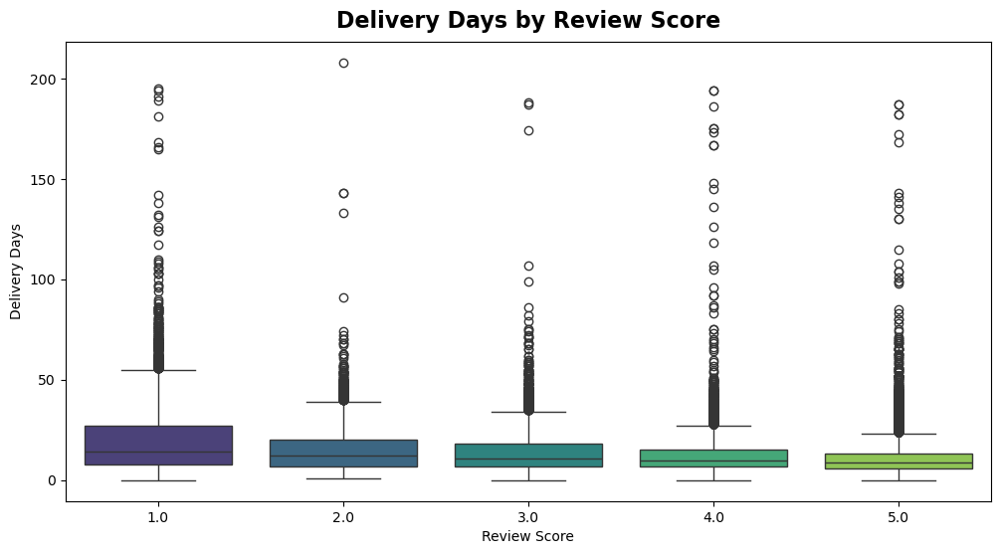

In [59]:
plt.figure(figsize=(12,6))
sns.boxplot(x=df_delivery_segmentation['review_score'], y=df_delivery_segmentation['delivery_days'], palette='viridis')
plt.xlabel('Review Score')
plt.ylabel('Delivery Days')
plt.title('Delivery Days by Review Score', size=16, pad=10, fontweight='bold')
plt.show()

In [60]:
# median review score vs late delivery 

median_rs = master_olist_dataset.groupby('is_late')['review_score'].median().reset_index()
median_rs

,is_late,review_score
0,False,5.0
1,True,2.0


In [61]:
median_rs['delivery_status'] = median_rs['is_late'].map({True: 'Late', False: 'On time'})

fig = px.bar(
    median_rs,
    x='delivery_status',
    y='review_score',
    title='Median Review Score: Late vs On-Time Deliveries',
    labels={
        'delivery_status': 'Delivery Status',
        'review_score': 'Median Review Score'
    },
    color='delivery_status',
    width=500,
    height=500
)

fig.update_layout(showlegend=True)
fig.update_traces(textposition='outside',texttemplate="<b>%{y:.1f}</b>")

fig.update_layout(showlegend=True)
fig.show()

,review_score,is_late,late_days,dispatch_delay,dispatch_time,transit_time,delivery_days
review_score,1.000000,-0.275629,-0.153369,-0.067233,-0.104805,-0.179747,-0.222219
is_late,-0.275629,1.000000,0.468199,0.155006,0.138286,0.341235,0.392208
late_days,-0.153369,0.468199,1.000000,0.307936,0.174791,0.228252,0.309852
dispatch_delay,-0.067233,0.155006,0.307936,1.000000,0.591151,-0.041399,0.181916
dispatch_time,-0.104805,0.138286,0.174791,0.591151,1.000000,0.041837,0.390349
transit_time,-0.179747,0.341235,0.228252,-0.041399,0.041837,1.000000,0.880985
delivery_days,-0.222219,0.392208,0.309852,0.181916,0.390349,0.880985,1.000000


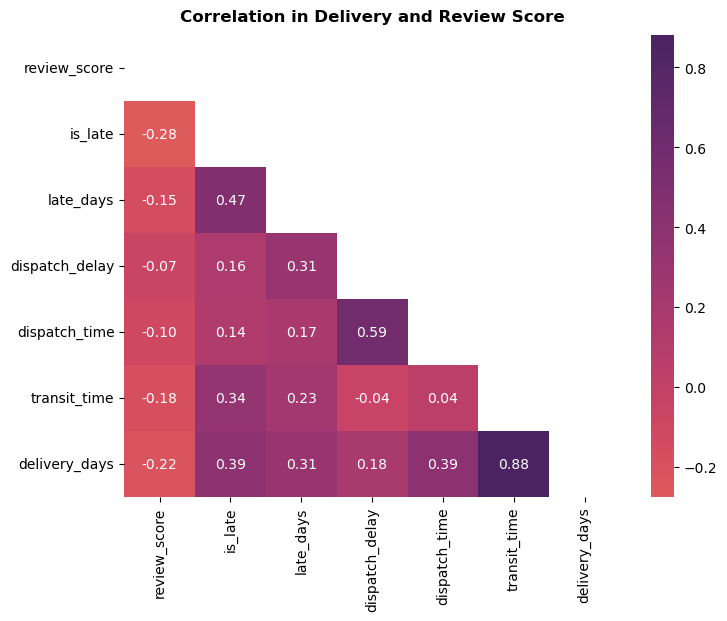

In [62]:
#correlation between numerical variables in delivery 
correlation_delivery = master_olist_dataset[['review_score','is_late','late_days','dispatch_delay','dispatch_time','transit_time','delivery_days']].corr(method = "spearman")
mtrx = np.triu(correlation_delivery)
display(correlation_delivery)

plt.figure(figsize = (8, 6))
sns.heatmap(
    data = correlation_delivery,
    annot = True,
    fmt = ".2f",
    cmap = "flare",
    center = 0,
    mask = mtrx
)

plt.title("Correlation in Delivery and Review Score", size=12, pad=10, fontweight='bold')
plt.show()

In [63]:
#review bucket 
master_olist_dataset['review_bucket'] = master_olist_dataset['review_score'].apply(lambda x: 'Good (4-5)' if x > 3 else 'Bad (1-3)')

# Create contingency table
cont_table = pd.crosstab(master_olist_dataset['is_late'], master_olist_dataset['review_bucket'])

# chi-square test
chi_square, p_value, dof, expected = chi2_contingency(cont_table)

# print
print("Chi-square statistic:", chi_square)
print("p-value:", p_value)

# Interpret
if p_value < 0.05:
    print("✅ Statistically significant: Late delivery affects review score.")
else:
    print("❌ Not significant: No strong evidence that late delivery affects review score.")

Chi-square statistic: 9443.985625356248
p-value: 0.0
✅ Statistically significant: Late delivery affects review score.


#### **How late delivery affecting customer retention - for first timer order**

In [64]:
# Customer repeat & first-order flags
master_olist_dataset = master_olist_dataset.sort_values(['customer_unique_id','order_purchase_timestamp'])
master_olist_dataset['order_rank']        = master_olist_dataset.groupby('customer_unique_id')['order_purchase_timestamp'] \
                              .rank(method='first')
master_olist_dataset['first_order_flag']  = master_olist_dataset['order_rank'] == 1

order_counts = master_olist_dataset.groupby('customer_unique_id')['order_id'].nunique()
master_olist_dataset['customer_repeat_flag'] = master_olist_dataset['customer_unique_id'].map(order_counts > 1)

master_olist_dataset.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,late_days,dispatch_delay,is_late_dispatch,dispatch_time,transit_time,delivery_days,review_bucket,order_rank,first_order_flag,customer_repeat_flag
58290,e22acc9c116caa3f2b7121bbb380d08e,fadbb3709178fc513abc1b2670aa1ad2,delivered,2018-05-10 10:56:27,2018-05-10 11:11:18,2018-05-12 08:18:00,2018-05-16 20:48:37,2018-05-21,0000366f3b9a7992bf8c76cfdf3221e2,7787,...,-5,-4,False,1,4,6,Good (4-5),1.0,True,False
81604,3594e05a005ac4d06a72673270ef9ec9,4cb282e167ae9234755102258dd52ee8,delivered,2018-05-07 11:11:27,2018-05-07 18:25:44,2018-05-09 12:18:00,2018-05-10 18:02:42,2018-05-15,0000b849f77a49e4a4ce2b2a4ca5be3f,6053,...,-5,-3,False,1,1,3,Good (4-5),1.0,True,False
29222,b33ec3b699337181488304f362a6b734,9b3932a6253894a02c1df9d19004239f,delivered,2017-03-10 21:05:03,2017-03-10 21:05:03,2017-03-13 12:58:30,2017-04-05 14:38:47,2017-04-07,0000f46a3911fa3c0805444483337064,88115,...,-2,-3,False,2,23,25,Bad (1-3),1.0,True,False
108856,41272756ecddd9a9ed0180413cc22fb6,914991f0c02ef0843c0e7010c819d642,delivered,2017-10-12 20:29:41,2017-10-12 20:49:17,2017-10-13 20:08:19,2017-11-01 21:23:05,2017-11-13,0000f6ccb0745a6a4b88665a16c9f078,66812,...,-12,-6,False,0,19,20,Good (4-5),1.0,True,False
45907,d957021f1127559cd947b62533f484f7,47227568b10f5f58a524a75507e6992c,delivered,2017-11-14 19:45:42,2017-11-14 20:06:52,2017-11-16 19:52:10,2017-11-27 23:08:56,2017-12-05,0004aac84e0df4da2b147fca70cf8255,18040,...,-8,-7,False,1,11,13,Good (4-5),1.0,True,False


In [65]:
# Retention delta (Δ repeat-rate between on-time vs. late first orders)
firsts = master_olist_dataset[master_olist_dataset['first_order_flag']]
ret = firsts.groupby('is_late').agg(
    total_customers=('customer_unique_id','nunique'),
    repeat_customers=('customer_repeat_flag', 'sum')
).reset_index()
ret['repeat_rate'] = ret['repeat_customers']/ret['total_customers']

rr_on_time = ret.loc[ret['is_late']==False, 'repeat_rate'].iloc[0]
rr_late    = ret.loc[ret['is_late']==True,  'repeat_rate'].iloc[0]
retention_delta = rr_on_time - rr_late

print(f"Retention on time first orders: {rr_on_time*100:.4f}%")
print(f"Retention late first orders: {rr_late*100:.4f}%")
print(f"Retention Δ (on-time vs late first orders): {retention_delta*100:.4f}%")

Retention on time first orders: 3.0413%
Retention late first orders: 2.5132%
Retention Δ (on-time vs late first orders): 0.5282%


In [69]:
#Impact model: lost revenue from late first orders
late_first_count = ret.loc[ret['is_late']==True, 'total_customers'].iloc[0]
avg_order_value  = master_olist_dataset['total_payment_value'].mean()
lost_revenue     = retention_delta * late_first_count * avg_order_value

print(f"Estimated lost revenue from late first orders: {lost_revenue:,.2f}")

Estimated lost revenue from late first orders: 7,205.56


In [70]:
#chisuare analysis 
#  contingency table
cont_table = pd.crosstab(
    firsts['is_late'],
    firsts['customer_repeat_flag']
)

# rename rows/cols for readability
cont_table.index = ['On-Time First Order', 'Late First Order']
cont_table.columns = ['Not Repeated', 'Repeated']

# Chi-Square test
chi2, p, dof, expected = chi2_contingency(cont_table)

# Print
print("Contingency Table:\n", cont_table)
print(f"\nChi² Statistic: {chi2:.4f}")
print(f"Degrees of Freedom: {dof}")
print(f"P-value: {p:.6f}")

if p < 0.05:
    print("\n✅ Statistically significant: Late delivery is associated with customer retention.")
else:
    print("\n❌ Not statistically significant: No clear evidence that late delivery affects retention.")

Contingency Table:
                      Not Repeated  Repeated
On-Time First Order         82953      2602
Late First Order             7409       191

Chi² Statistic: 6.5145
Degrees of Freedom: 1
P-value: 0.010700

✅ Statistically significant: Late delivery is associated with customer retention.


## **3.2 In-dept Analysis of Delivery Performance**

#### **3.2.1 On-time Delivery Rate of Olist e-commerce**

In [71]:
df_delivery = master_olist_dataset.copy()

In [72]:
# Monthly OTD rate calculation:
df_delivery['delivery_month'] = df_delivery['order_delivered_customer_date'].dt.to_period('M')
df_delivery['delivered_on_time'] = df_delivery['is_late'] == False


monthly_otd = (
    df_delivery.groupby('delivery_month').agg(
        total_orders=('order_id', 'count'),
        late_orders=('is_late', 'sum'),
        on_time_orders=('delivered_on_time', 'sum')
    ).reset_index()
)

#Calculate OTD rate
monthly_otd['OTD (%)'] = (monthly_otd['on_time_orders'] / monthly_otd['total_orders']) * 100
monthly_otd['OTD (%)'] = monthly_otd['OTD (%)'].round(2)

# Present and print
monthly_otd = monthly_otd.rename(columns={
    'delivery_month': 'Month',
    'total_orders': 'Total Orders',
    'late_orders': 'Late Orders',
    'on_time_orders': 'On-Time Orders'
})

monthly_otd

,Month,Total Orders,Late Orders,On-Time Orders,OTD (%)
0,2016-10,236,0,236,100.00
1,2016-11,69,1,68,98.55
2,2016-12,4,2,2,50.00
3,2017-01,326,0,326,100.00
4,2017-02,1559,3,1556,99.81
5,2017-03,2721,70,2651,97.43
6,2017-04,2065,126,1939,93.90
7,2017-05,4199,240,3959,94.28
8,2017-06,3634,129,3505,96.45
9,2017-07,3905,151,3754,96.13


In [73]:
# Filter for deliveries completed before 2018:
df_pre_2018 = df_delivery[
    df_delivery['order_delivered_customer_date'].dt.year < 2018
].copy()

# Calculate total and on-time deliveries:
total_deliveries_pre_2018 = len(df_pre_2018)
on_time_deliveries_pre_2018 = df_pre_2018['delivered_on_time'].sum()

# Calculate OTD:
otd_pre_2018 = (on_time_deliveries_pre_2018 / total_deliveries_pre_2018) * 100
print(f"OTD Rate for 2016-2017: {otd_pre_2018:.2f}%")

# Also display the count for context
print(f"Total deliveries in 2016-2017: {total_deliveries_pre_2018}")
print(f"On-time deliveries in 2016-2017: {on_time_deliveries_pre_2018}")

OTD Rate for 2016-2017: 94.85%
Total deliveries in 2016-2017: 47050
On-time deliveries in 2016-2017: 44628


In [74]:
# Filter for deliveries completed in 2018:
df_2018 = df_delivery[
    df_delivery['order_delivered_customer_date'].dt.year == 2018
].copy()

# Calculate total and on-time deliveries:
total_deliveries_2018 = len(df_2018)
on_time_deliveries_2018 = df_2018['delivered_on_time'].sum()

# Calculate OTD:
otd_2018 = (on_time_deliveries_2018 / total_deliveries_2018) * 100
print(f"OTD Rate for 2018: {otd_2018:.2f}%")
print(f"Total deliveries in 2018: {total_deliveries_2018}")
print(f"On-time deliveries in 2018: {on_time_deliveries_2018}")

OTD Rate for 2018: 90.00%
Total deliveries in 2018: 62883
On-time deliveries in 2018: 56597


In [75]:

monthly_otd['Month'] = monthly_otd['Month'].astype(str)

# Filter out months with 0% OTD --> no sales 
monthly_otd_filtered = monthly_otd[~monthly_otd['Month'].isin(['2018-09', '2018-10'])].copy()
monthly_otd_filtered = monthly_otd_filtered.sort_values('Month').reset_index(drop=True)

#Prepare y values
y_vals = monthly_otd_filtered['OTD (%)'].values

# Plotly line chart
fig = go.Figure()

# Main OTD line:
fig.add_trace(go.Scatter(
    x=monthly_otd_filtered['Month'],
    y=y_vals,
    mode='lines+markers',
    name='OTD',
    line=dict(color='blue', width=3),
    marker=dict(color='blue', size=8)
))

# Highlight points below 95%:
below_95 = monthly_otd_filtered[monthly_otd_filtered['OTD (%)'] < 95]

fig.add_trace(go.Scatter(
    x=below_95['Month'],
    y=below_95['OTD (%)'],
    mode='markers+text',
    name='Below 95%',
    marker=dict(color='red', size=10, symbol='circle-open'),
    text=['⚠️' for _ in range(len(below_95))],
    textposition='top center',
    showlegend=True
))

fig.update_layout(
    title='Monthly On-Time Delivery (OTD) Trend (Excl. Sep-Oct 2018)',
    xaxis_title='Month',
    yaxis_title='OTD (%)',
    yaxis_range=[75, 101],
    template='plotly_white'
)

fig.show()

#### **3.2.2 Impact of Total order on OTD rate**

In [76]:
# combining two factors OTD and the total orders per month 
# left y axis is OTD rate
fig.add_trace(go.Scatter(
    x=monthly_otd_filtered['Month'],
    y=monthly_otd_filtered['OTD (%)'],
    mode='lines+markers',
    name='OTD (%)',
    line=dict(color='blue', width=3),
    marker=dict(color='blue', size=8),
    yaxis='y1',
    legendgroup= 'otd',
    showlegend=True
))

# right Y axis is the total month order 
fig.add_trace(go.Scatter(
    x=monthly_otd_filtered['Month'],
    y=monthly_otd_filtered['Total Orders'],
    mode='lines+markers',
    name='Total Orders',
    line=dict(color='orange', width=3, dash='dot'),
    marker=dict(color='orange', size=8),
    yaxis='y2'
))

# Highlight OTD below 95% --> for the left axis 
below_95 = monthly_otd_filtered[monthly_otd_filtered['OTD (%)'] < 95]

fig.add_trace(go.Scatter(
    x=below_95['Month'],
    y=below_95['OTD (%)'],
    mode='markers+text',
    name='OTD <95%',
    marker=dict(color='red', size=10, symbol='circle-open'),
    text=['⚠️' for _ in range(len(below_95))],
    textposition='top center',
    showlegend=False,
    yaxis='y1'
))

# layout for two y axes 
fig.update_layout(
    title='Monthly On-Time Delivery Rate vs. Total Orders',
    xaxis=dict(title='Month'),
    yaxis=dict(
        title='OTD (%)',
        range=[75, 101],
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title='Total Orders',
        overlaying='y',
        side='right',
        titlefont=dict(color='orange'),
        tickfont=dict(color='orange')
    ),
    legend=dict(x=1.05, y=1, bordercolor="gray", borderwidth=1),
    template='plotly_white',
    margin=dict(r=200) 
)

fig.show()

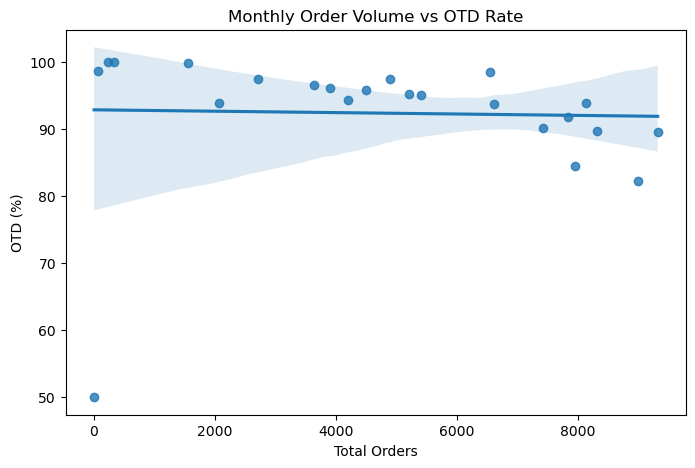

Spearman correlation: -0.628 (p=0.0013)


In [77]:
#correlation between total orders and OTD rate
# 1. Scatterplot
plt.figure(figsize=(8, 5))
sns.regplot(x='Total Orders', y='OTD (%)', data=monthly_otd_filtered)
plt.title('Monthly Order Volume vs OTD Rate')
plt.xlabel('Total Orders')
plt.ylabel('OTD (%)')
plt.show()

# 2. Correlation tests
OTD_order_corr, spearman_p_value = spearmanr(monthly_otd_filtered['Total Orders'], monthly_otd_filtered['OTD (%)'])
print(f"Spearman correlation: {OTD_order_corr:.3f} (p={spearman_p_value:.4f})")


### **3.2.2 Seller delivery performance**

##### **Dispatch Delay and Late Delivery**

In [78]:
#top 10 order id late delivery and late dispatch
late_seller_both = df_delivery[
    (df_delivery['is_late'] == True) &
    (df_delivery['is_late_dispatch'] == True)
]
#top 10 seller late only at dispatch
late_seller_dispatch = df_delivery[
    (df_delivery['is_late_dispatch'] == True)
]

#top 10 seller late only in delivery
late_seller_delivery = df_delivery[
    (df_delivery['is_late'] == True)
]


In [79]:
top10_late_seller_both = late_seller_both.groupby('seller_id')['order_id'].nunique().reset_index().sort_values(by='order_id', ascending=False).head(10)
top10_late_seller_both

,seller_id,order_id
16,06a2c3af7b3aee5d69171b0e14f0ee87,77
31,1025f0e2d44d7041d6cf58b6550e0bfa,42
281,88460e8ebdecbfecb5f9601833981930,40
263,8160255418d5aaa7dbdc9f4c64ebda44,30
250,7c67e1448b00f6e969d365cea6b010ab,27
164,54965bbe3e4f07ae045b90b0b8541f52,22
341,a49928bcdf77c55c6d6e05e09a9b4ca5,21
98,2eb70248d66e0e3ef83659f71b244378,19
246,7aa4334be125fcdd2ba64b3180029f14,17
468,e9bc59e7b60fc3063eb2290deda4cced,16


In [80]:
top10_late_seller_dispatch = late_seller_dispatch.groupby('seller_id')['order_id'].nunique().reset_index().sort_values(by='order_id', ascending=False).head(10)
top10_late_seller_dispatch

,seller_id,order_id
455,7c67e1448b00f6e969d365cea6b010ab,140
507,88460e8ebdecbfecb5f9601833981930,98
29,06a2c3af7b3aee5d69171b0e14f0ee87,97
58,1025f0e2d44d7041d6cf58b6550e0bfa,82
475,8160255418d5aaa7dbdc9f4c64ebda44,67
445,7aa4334be125fcdd2ba64b3180029f14,50
171,2eb70248d66e0e3ef83659f71b244378,49
497,85d9eb9ddc5d00ca9336a2219c97bb13,48
195,37515688008a7a40ac93e3b2e4ab203f,45
261,4a3ca9315b744ce9f8e9374361493884,42


In [81]:
top10_late_seller_delivery = late_seller_delivery.groupby('seller_id')['order_id'].nunique().reset_index().sort_values(by='order_id', ascending=False).head(10)
top10_late_seller_delivery

,seller_id,order_id
401,4a3ca9315b744ce9f8e9374361493884,195
192,1f50f920176fa81dab994f9023523100,148
395,4869f7a5dfa277a7dca6462dcf3b52b2,130
1268,ea8482cd71df3c1969d7b9473ff13abc,118
553,6560211a19b47992c3666cc44a7e94c0,117
1105,cc419e0650a3c5ba77189a1882b7556a,101
1187,da8622b14eb17ae2831f4ac5b9dab84a,100
689,7c67e1448b00f6e969d365cea6b010ab,98
826,955fee9216a65b617aa5c0531780ce60,98
777,8b321bb669392f5163d04c59e235e066,97


In [82]:
n_seller_late_delivery = late_seller_delivery['seller_id'].nunique()
n_seller_late_both = late_seller_both['seller_id'].nunique()
n_seller_late_dispatch = late_seller_dispatch['seller_id'].nunique()   
n_total_sellers = df_delivery['seller_id'].nunique() 

ratio_late_delivery = n_seller_late_delivery / n_total_sellers *100
ratio_late_both = n_seller_late_both / n_total_sellers * 100
ratio_late_dispatch = n_seller_late_dispatch / n_total_sellers * 100

print(f"Total number of sellers: {n_total_sellers}")
print(f"Number of sellers with late delivery : {n_seller_late_delivery}")
print(f"Number of sellers with late dispatch only: {n_seller_late_dispatch}")
print(f"Number of sellers with late dispatch and delivery: {n_seller_late_both}")

print(f"Percentage of sellers with late delivery: {ratio_late_delivery:.2f}%")
print(f"Percentage of sellers with late dispatch only: {ratio_late_dispatch:.2f}%")
print(f"Percentage of sellers with late dispatch and delivery: {ratio_late_both:.2f}%")

Total number of sellers: 2965
Number of sellers with late delivery : 1390
Number of sellers with late dispatch only: 944
Number of sellers with late dispatch and delivery: 518
Percentage of sellers with late delivery: 46.88%
Percentage of sellers with late dispatch only: 31.84%
Percentage of sellers with late dispatch and delivery: 17.47%


In [83]:

# Create contingency table at the order level
contingency = pd.crosstab(df_delivery['is_late_dispatch'], df_delivery['is_late'])
print("Contingency Table (Order Level):")
print(contingency)

chi2, p, dof, expected = chi2_contingency(contingency)
print(f"\nChi-square test (Order Level): chi2={chi2:.2f}, p-value={p:.4f}")

if p < 0.05:
    print("There is a statistically significant association between late dispatch and late delivery at the order level.")
else:
    print("No statistically significant association between late dispatch and late delivery at the order level.")

Contingency Table (Order Level):
is_late           False  True 
is_late_dispatch              
False             97866   6950
True               3359   1758

Chi-square test (Order Level): chi2=5138.06, p-value=0.0000
There is a statistically significant association between late dispatch and late delivery at the order level.


In [85]:
# First, create a DataFrame with a row for each seller and binary flags
seller_late_dispatch = set(late_seller_dispatch['seller_id'])
seller_late_delivery = set(late_seller_delivery['seller_id'])
all_sellers = set(df_delivery['seller_id'])

seller_df = pd.DataFrame({'seller_id': list(all_sellers)})
seller_df['has_late_dispatch'] = seller_df['seller_id'].isin(seller_late_dispatch)
seller_df['has_late_delivery'] = seller_df['seller_id'].isin(seller_late_delivery)

# Contingency table
contingency_seller = pd.crosstab(seller_df['has_late_dispatch'], seller_df['has_late_delivery'])
print("Contingency Table (Seller Level):")
print(contingency_seller)

chi2, p, dof, expected = chi2_contingency(contingency_seller)
print(f"\nChi-square test (Seller Level): chi2={chi2:.2f}, p-value={p:.4f}")

if p < 0.05:
    print("There is a statistically significant association between sellers having late dispatch and late delivery.")
else:
    print("No statistically significant association between late dispatch and late delivery at the seller level.")

Contingency Table (Seller Level):
has_late_delivery  False  True 
has_late_dispatch              
False               1366    655
True                 209    735

Chi-square test (Seller Level): chi2=531.93, p-value=0.0000
There is a statistically significant association between sellers having late dispatch and late delivery.


seller level

In [96]:
# Seller-level dispatch delay and late rate (for sellers with at least 30 orders)
seller_performance = df_delivery.groupby('seller_id').agg(
    avg_dispatch_delay=('dispatch_delay', 'mean'),
    seller_late_rate=('delivered_on_time', lambda x: 1 - x.mean()),
    total_orders=('order_id', 'nunique')
)
seller_performance = seller_performance[seller_performance['total_orders'] >= 30]

# Correlation between seller's avg dispatch delay and late rate
seller_corr = seller_performance[['avg_dispatch_delay', 'seller_late_rate']].corr().iloc[0,1]

# Find sellers with both long dispatch and high late rates
outlier_sellers = seller_performance[
    (seller_performance['avg_dispatch_delay'] > 4) & (seller_performance['seller_late_rate'] > 0.15)
].sort_values(['avg_dispatch_delay', 'seller_late_rate'], ascending=False)


seller_corr, outlier_sellers.head(5)

(0.3125119312925543,
                                   avg_dispatch_delay  seller_late_rate  \
 seller_id                                                                
 54965bbe3e4f07ae045b90b0b8541f52            8.925926          0.320988   
 
                                   total_orders  
 seller_id                                       
 54965bbe3e4f07ae045b90b0b8541f52            73  )

seller level vs order volume

In [94]:
# Calculate average and median number of orders per seller
avg_orders = seller_performance['total_orders'].mean()
median_orders = seller_performance['total_orders'].median()

print(f"Average number of orders per seller: {avg_orders:.2f}")
print(f"Median number of orders per seller: {median_orders}")

Average number of orders per seller: 130.10
Median number of orders per seller: 68.0


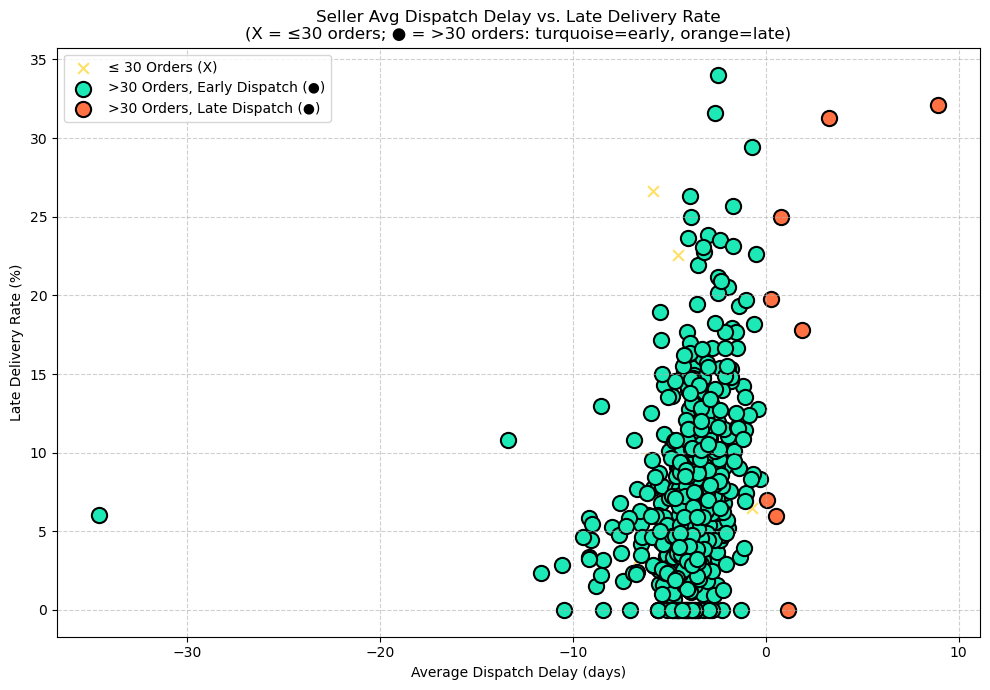

In [97]:
# Masks
high_volume = seller_performance['total_orders'] > 30
low_volume = ~high_volume
early = seller_performance['avg_dispatch_delay'] < 0
late = seller_performance['avg_dispatch_delay'] >= 0

plt.figure(figsize=(10, 7))

# 1. Low-volume sellers (yellow X)
plt.scatter(
    seller_performance.loc[low_volume, 'avg_dispatch_delay'],
    seller_performance.loc[low_volume, 'seller_late_rate']*100,
    alpha=0.6,
    color='#ffcc00',
    marker='x',
    s=60,
    label='≤ 30 Orders (X)'
)

# 2. High-volume, early dispatch (turquoise circles)
plt.scatter(
    seller_performance.loc[high_volume & early, 'avg_dispatch_delay'],
    seller_performance.loc[high_volume & early, 'seller_late_rate']*100,
    alpha=1,
    color='#1de9b6',        # Bold turquoise
    marker='o',
    s=120,
    edgecolor='black',
    linewidths=1.5,
    label='>30 Orders, Early Dispatch (●)'
)

# 3. High-volume, late dispatch (orange circles)
plt.scatter(
    seller_performance.loc[high_volume & late, 'avg_dispatch_delay'],
    seller_performance.loc[high_volume & late, 'seller_late_rate']*100,
    alpha=1,
    color='#ff7043',        # Bold orange
    marker='o',
    s=120,
    edgecolor='black',
    linewidths=1.5,
    label='>30 Orders, Late Dispatch (●)'
)

plt.xlabel('Average Dispatch Delay (days)')
plt.ylabel('Late Delivery Rate (%)')
plt.title('Seller Avg Dispatch Delay vs. Late Delivery Rate\n'
          '(X = ≤30 orders; ● = >30 orders: turquoise=early, orange=late)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

Seller dispatch speed is important, but not the only factor influencing late delivery.

Some sellers do their job quickly, but their orders are still late—likely due to:
Shipping/carrier delays (e.g., remote regions, bad infrastructure, slow last-mile partners)
Product type (fragile, large, or regulated items might move slower)
Customer location (long distances, hard-to-reach addresses)
Order surges (peak events, holidays)
Systemic issues—not just seller performance—contribute to late delivery.

In [127]:
# Aggregate late delivery data by seller ID:
top_sellers = df_delivery['seller_id'].value_counts().nlargest(20).index
df_top_sellers = df_delivery[df_delivery['seller_id'].isin(top_sellers)]

# Calculate delivery delay days for top sellers:
seller_box_fig = px.box(
    df_top_sellers,
    x='seller_id',
    y='late_days',
    points='outliers',
    title='Top 20 Sellers by Order Volume by Delivery Delay Distribution',
    labels={'seller_id': 'Seller ID', 'late_days': 'Delivery Delay (Days)'},
    color='seller_id'
)

seller_box_fig.update_layout(showlegend=False)
seller_box_fig.show()

**Top 20 Sellers by Order Volume by Delivery Delay Distribution:**

This chart presents the delivery delay distribution (in days) for the top 20 sellers based on total order volume.

**Key Observations:**

- Most sellers show a **tight interquartile range** centred around **on-time or slightly early delivery**, indicating consistent performance.
- However, **many sellers exhibit significant outliers**, with delivery delays occasionally exceeding **100 days**.
- Several sellers (e.g., `7c67e1448b00f6e969d365ceab6b7010ab`, `3d871de0142ce09041d6cf58b65500ebfa`) have **negative medians**, meaning a majority of their deliveries arrive ahead of the promised time.
- Others (e.g., `cc4a4b1086534108cc3ab77b9437ff13abc`, `e9779976487b77c6d4ac45f75ec7afe9`) have a **slightly positive delay median**, suggesting room for improvement in shipping speed.
- **High variance** in delay (especially on the positive side) might point to issues with **logistics partners or inventory management**.

**Summary:**

While most top sellers maintain generally good delivery performance, **outlier delays remain a concern**. These anomalies could significantly affect customer experience and should be addressed by reviewing seller-level logistics operations and exception handling processes.

### **3.2.3 Geographical**

##### **Late Delivery Rate per `customer_state`**

In [108]:
# Group by customer_state and calculate % late
state_late_df = df_delivery.groupby('customer_state')['is_late'].agg(['count', 'sum']).reset_index()
state_late_df.columns = ['customer_state', 'total_orders', 'late_orders']
state_late_df['late_percentage'] = (state_late_df['late_orders'] / state_late_df['total_orders']) * 100

state_late_df = state_late_df.sort_values('late_percentage', ascending=False)
state_late_df.head(10)

,customer_state,total_orders,late_orders,late_percentage
1,AL,427,103,24.121780
9,MA,797,163,20.451694
24,SE,374,61,16.310160
16,PI,519,81,15.606936
5,CE,1425,218,15.298246
4,BA,3679,503,13.672194
18,RJ,14116,1835,12.999433
13,PA,1053,131,12.440646
26,TO,309,38,12.297735
7,ES,2219,272,12.257774


In [99]:
# Plotting the percentage of late deliveries by customer state:
state_late_fig = px.bar(
    state_late_df.sort_values(by='late_percentage', ascending=False),
    x='customer_state',
    y='late_percentage',
    color='late_percentage',
    title='Percentage of Late Deliveries by Customer State',
    labels={'late_percentage': '% of Late Deliveries', 'customer_state': 'Customer State'},
    color_continuous_scale='OrRd'
)

state_late_fig.show()

**Percentage of Late Deliveries by Customer State:**

This bar chart shows the proportion of late deliveries across different customer states, highlighting geographic variations in delivery performance.

**Key Insights:**

- **Alagoas (AL)** and **Maranhão (MA)** have the highest late delivery rates, exceeding **20%**, signaling potential logistical or infrastructural challenges.
- A cluster of **Northeastern states** (e.g., PI, SE, CE, BA) also exhibit higher late delivery percentages, mostly ranging between **13% and 16%**.
- In contrast, states like **Acre (AC)**, **Rondônia (RO)**, and **Amazonas (AM)** have the **lowest late delivery rates**, all under **5%**.

**Summary:**

Late delivery rates vary significantly by state, with a noticeable concentration of delays in the **Northeast region**. This insight can help prioritise regional performance improvements and targeted logistics strategies.

##### **Top 20 Cities by Order Count and Lateness %** 

In [122]:
# Aggregate late delivery data by customer city:
city_late_df = df_delivery.groupby('customer_city')['is_late'].agg(['count', 'sum']).reset_index()
city_late_df.columns = ['customer_city', 'total_orders', 'late_orders']
city_late_df['late_percentage'] = (city_late_df['late_orders'] / city_late_df['total_orders']) * 100

# Filter top 20 cities by total orders:
top10_cities = city_late_df.sort_values(by='total_orders', ascending=False).head(20)
top10_cities


,customer_city,total_orders,late_orders,late_percentage
3560,sao paulo,17368,1081,6.224090
3123,rio de janeiro,7577,860,11.350139
449,belo horizonte,3074,194,6.310995
553,brasilia,2337,175,7.488233
1134,curitiba,1724,84,4.872390
700,campinas,1626,160,9.840098
2933,porto alegre,1563,180,11.516315
3215,salvador,1355,231,17.047970
1517,guarulhos,1290,79,6.124031
3395,sao bernardo do campo,1038,62,5.973025


In [123]:

# Plotting the top 20 cities by percentage of late deliveries:
top10_cities_fig = px.bar(
    top10_cities.sort_values(by='late_percentage', ascending=False),
    x='customer_city',
    y='late_percentage',
    color='late_percentage',
    title='Top 20 Cities by Orders by % of Late Deliveries',
    labels={'late_percentage': '% of Late Deliveries', 'customer_city': 'City'},
    color_continuous_scale='Blues'
)

top10_cities_fig.show()

**Top 20 Cities by Orders by % of Late Deliveries:**

This bar chart presents the top 20 Brazilian cities (by volume of orders) ranked by their percentage of late deliveries.

**Key Insights:**

- **Fortaleza** and **Salvador** lead with the **highest late delivery rates**, at **~18%** and **~17%**, respectively, suggesting systemic delivery inefficiencies in these cities.
- Cities like **Recife**, **Niterói**, and **Porto Alegre** also show moderately high late delivery rates, ranging between **11% and 13%**.
- On the lower end, **Santo André**, **Sorocaba**, and **Osasco** maintain late delivery rates under **5%**, reflecting more consistent fulfillment performance.

**Summary:**

Late delivery rates vary considerably even among major cities. Notably, **Northeastern capitals** (e.g., Fortaleza, Salvador, Recife) show a tendency toward higher delays, highlighting potential regional logistics challenges.

### **3.2.4 Product attribution**

In [ ]:
#product category analysis related to late delivery

late_products = df_delivery[df_delivery['is_late'] == True]   
late_products_count = late_products.groupby('product_category_name_english')['order_id'].nunique().reset_index()
late_products_count.columns = ['product_category_name_english', 'late_order_count']
late_products_count = late_products_count.sort_values(by='late_order_count', ascending=False).head
late_products_count(10)

,product_category_name_english,late_order_count
7,bed_bath_table,811
41,health_beauty,774
62,sports_leisure,584
37,furniture_decor,535
14,computers_accessories,503
68,watches_gifts,468
47,housewares,399
65,telephony,349
5,auto,327
66,toys,286


In [ ]:
# Core delay & flag features
master_olist_dataset['is_late']    = master_olist_dataset['order_delivered_customer_date'] > master_olist_dataset['order_estimated_delivery_date']
master_olist_dataset['late_days']    = (master_olist_dataset['order_delivered_customer_date'] - master_olist_dataset['order_estimated_delivery_date']).dt.days
master_olist_dataset['dispatch_delay'] = (master_olist_dataset['order_delivered_carrier_date'] - master_olist_dataset['shipping_limit_date']).dt.days
master_olist_dataset['is_late_dispatch'] = (master_olist_dataset['dispatch_delay'] > 0)
master_olist_dataset['dispatch_time'] = (master_olist_dataset['order_delivered_carrier_date'] - master_olist_dataset['order_approved_at']).dt.days
master_olist_dataset['transit_time']  = (master_olist_dataset['order_delivered_customer_date']  - master_olist_dataset['order_delivered_carrier_date']).dt.days
master_olist_dataset['delivery_days'] = (master_olist_dataset['order_delivered_customer_date'] - master_olist_dataset['order_purchase_timestamp']).dt.days

# Review bucket
master_olist_dataset['review_bucket'] = master_olist_dataset['review_score'].apply(lambda x: 'Good (4-5)' if x > 3 else 'Bad (1-3)')

In [ ]:
df['delivery_delay_days'] = (df['order_delivered_customer_date'] - df['order_estimated_delivery_date']).dt.days